### Insurance Fraud Detection Machine Learning Project

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score,classification_report
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("insurance_claims.csv")

In [3]:
df.shape

(1000, 40)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [6]:
#Missing Values
df.isnull().sum()*100/len(df)

months_as_customer               0.0
age                              0.0
policy_number                    0.0
policy_bind_date                 0.0
policy_state                     0.0
policy_csl                       0.0
policy_deductable                0.0
policy_annual_premium            0.0
umbrella_limit                   0.0
insured_zip                      0.0
insured_sex                      0.0
insured_education_level          0.0
insured_occupation               0.0
insured_hobbies                  0.0
insured_relationship             0.0
capital-gains                    0.0
capital-loss                     0.0
incident_date                    0.0
incident_type                    0.0
collision_type                   0.0
incident_severity                0.0
authorities_contacted            0.0
incident_state                   0.0
incident_city                    0.0
incident_location                0.0
incident_hour_of_the_day         0.0
number_of_vehicles_involved      0.0
p

In [7]:
df['collision_type'].unique()

array(['Side Collision', '?', 'Rear Collision', 'Front Collision'],
      dtype=object)

In [8]:
df.drop('_c39',axis=1,inplace=True)

In [9]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

<AxesSubplot: xlabel='fraud_reported', ylabel='count'>

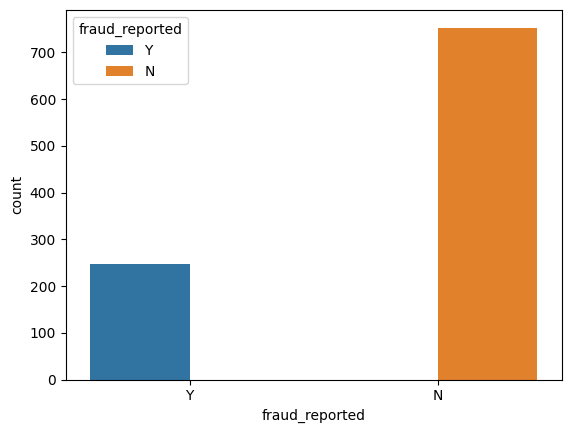

In [10]:
sns.countplot(x='fraud_reported', data=df, hue='fraud_reported')

In [11]:
df['fraud_reported'].value_counts() # Count number of frauds vs non-frauds

N    753
Y    247
Name: fraud_reported, dtype: int64

<AxesSubplot: xlabel='age', ylabel='Density'>

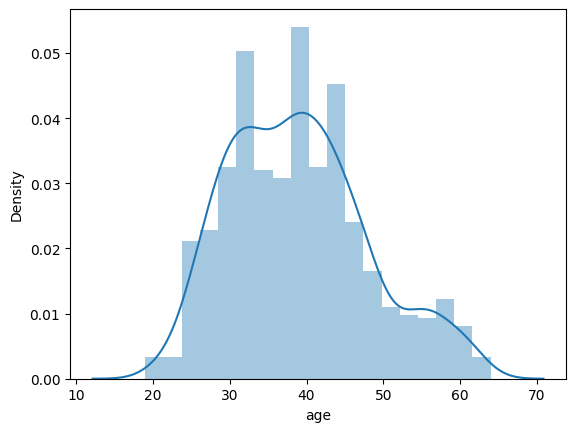

In [12]:
sns.distplot(df['age'])#Age  vs target column

In [13]:
df['policy_number'].nunique()#Policy number is not relevant to find fraud

1000

In [14]:
df['policy_bind_date'].nunique()#policy_bind_date


951

In [15]:
df['policy_bind_date'].value_counts()

2006-01-01    3
1992-04-28    3
1992-08-05    3
1991-12-14    2
2004-08-09    2
             ..
2014-06-03    1
1998-12-12    1
1999-02-18    1
1997-10-30    1
1996-11-11    1
Name: policy_bind_date, Length: 951, dtype: int64

<AxesSubplot: xlabel='policy_state', ylabel='count'>

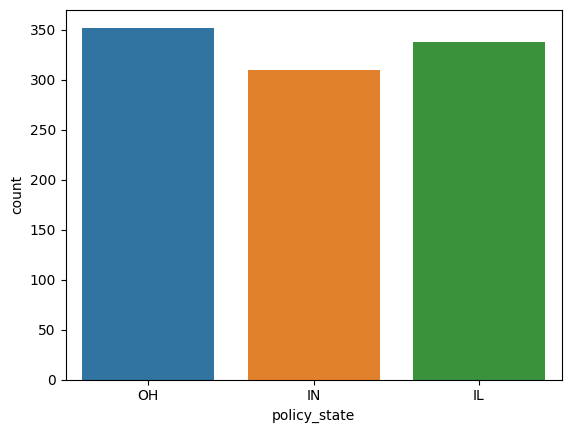

In [16]:
df['policy_state'].nunique()#policy_state
sns.countplot(x='policy_state', data=df)

<AxesSubplot: xlabel='incident_type', ylabel='count'>

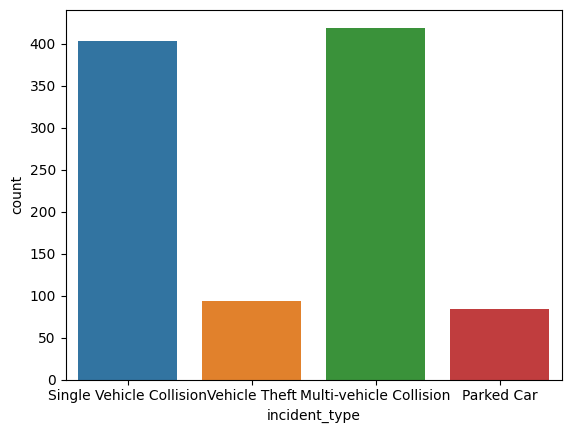

In [17]:
#incident_type vs fraud
df['incident_type'].unique()
sns.countplot(x='incident_type', data=df)

In [18]:
df['incident_type'].value_counts()

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64

<AxesSubplot: xlabel='collision_type', ylabel='count'>

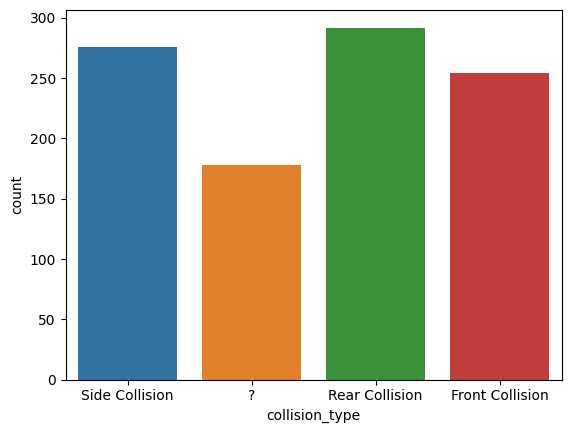

In [19]:
df['collision_type'].unique()
sns.countplot(x='collision_type', data=df)

In [20]:
df['collision_type'].value_counts()


Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [21]:
df['collision_type'].replace('?',np.nan,inplace=True)

In [22]:
df['collision_type'].value_counts(dropna=False)

Rear Collision     292
Side Collision     276
Front Collision    254
NaN                178
Name: collision_type, dtype: int64

In [23]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [24]:
df['incident_severity'].unique()

array(['Major Damage', 'Minor Damage', 'Total Loss', 'Trivial Damage'],
      dtype=object)

<AxesSubplot: xlabel='incident_severity', ylabel='count'>

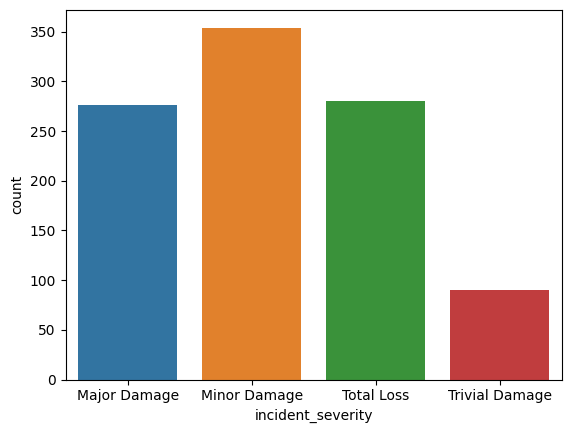

In [25]:
sns.countplot(x='incident_severity', data=df)

<AxesSubplot: xlabel='incident_severity', ylabel='count'>

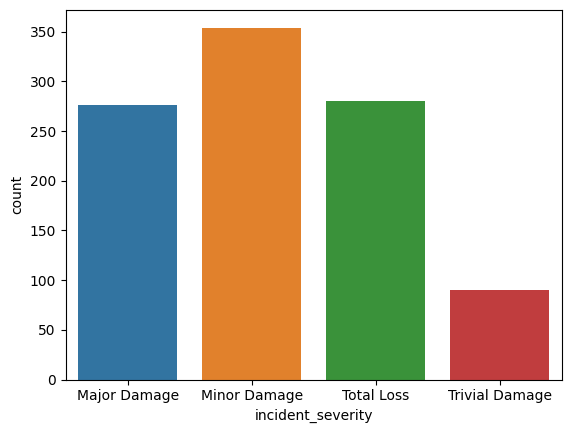

In [26]:
sns.countplot(x='incident_severity', data=df)

In [27]:
df['number_of_vehicles_involved'].unique()#number_of_vehicles_involved

array([1, 3, 4, 2], dtype=int64)

<AxesSubplot: xlabel='number_of_vehicles_involved', ylabel='count'>

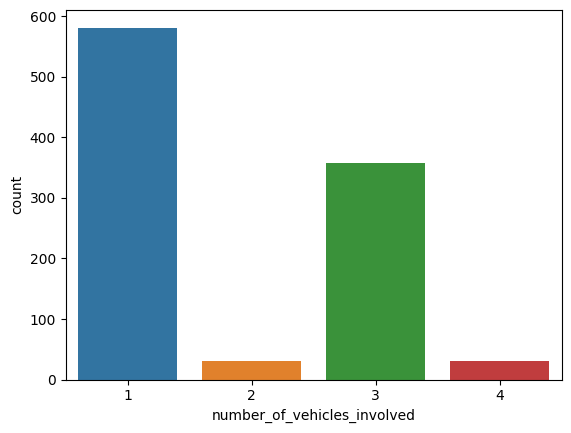

In [28]:
sns.countplot(x='number_of_vehicles_involved', data=df)

In [29]:
df['property_damage'].unique()

array(['YES', '?', 'NO'], dtype=object)

In [30]:
df['property_damage'].replace('?',np.nan, inplace=True)

In [31]:
df['property_damage'].unique()

array(['YES', nan, 'NO'], dtype=object)

In [32]:
df.groupby('property_damage')['fraud_reported'].value_counts()

property_damage  fraud_reported
NO               N                 272
                 Y                  66
YES              N                 224
                 Y                  78
Name: fraud_reported, dtype: int64

In [33]:
df.replace('?',np.nan,inplace=True)

In [34]:
df['bodily_injuries'].unique()#bodily_injuries

array([1, 0, 2], dtype=int64)

In [35]:
df['witnesses'].unique()

array([2, 0, 3, 1], dtype=int64)

<AxesSubplot: xlabel='witnesses', ylabel='count'>

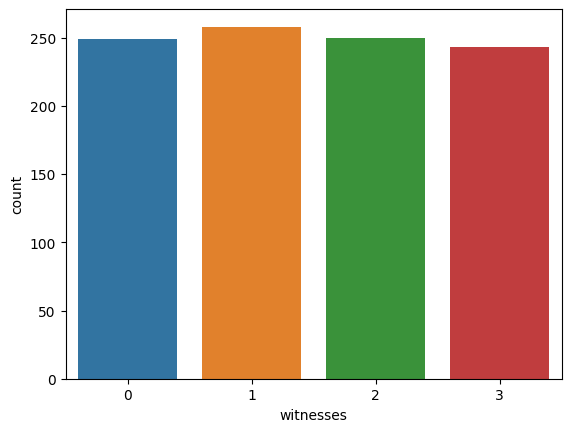

In [36]:
sns.countplot(x='witnesses', data=df)

<AxesSubplot: xlabel='police_report_available', ylabel='count'>

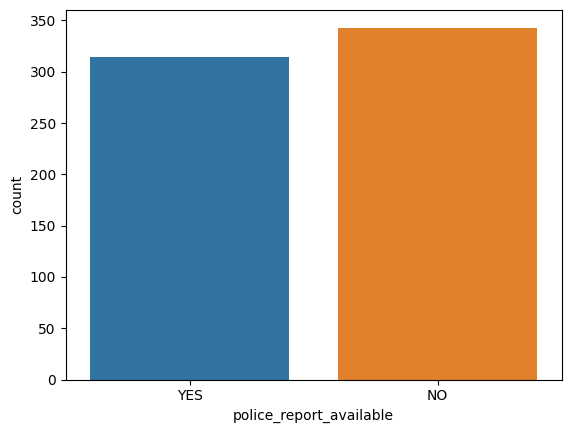

In [37]:
df['police_report_available'].unique()#police_report_available
sns.countplot(x='police_report_available', data=df)

<AxesSubplot: xlabel='count', ylabel='insured_education_level'>

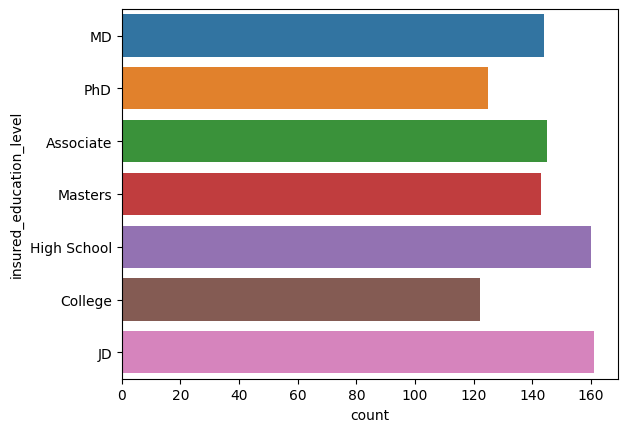

In [38]:
sns.countplot(y = 'insured_education_level', data=df)

<AxesSubplot: xlabel='incident_state', ylabel='count'>

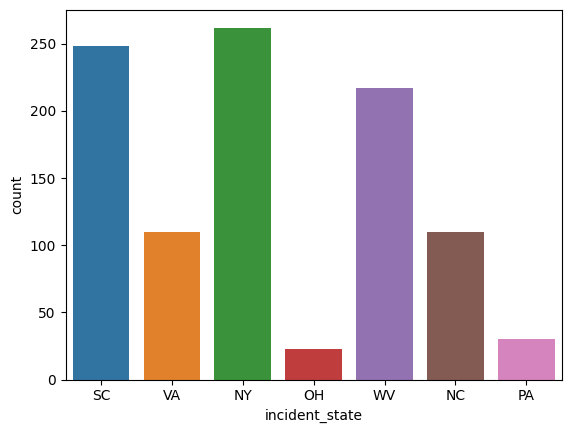

In [39]:
sns.countplot(x='incident_state', data=df)

<AxesSubplot: xlabel='incident_date'>

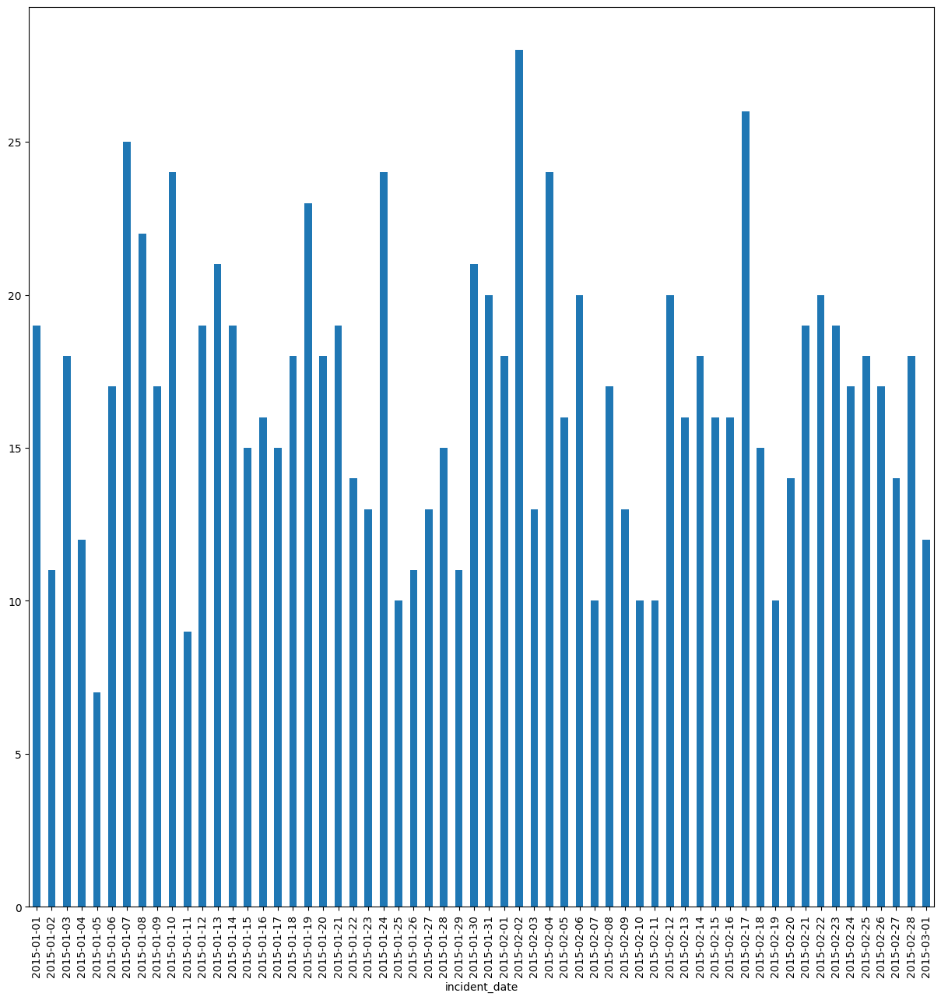

In [40]:
plt.figure(figsize=(15,15))
df.groupby('incident_date').total_claim_amount.count().plot.bar()

<AxesSubplot: ylabel='insured_sex'>

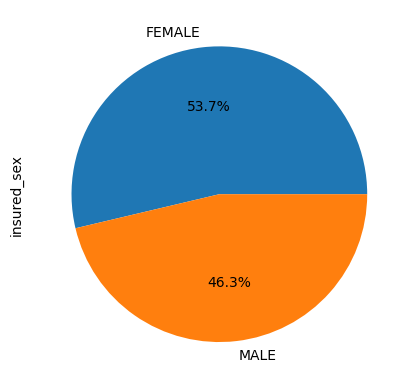

In [41]:
df['insured_sex'].value_counts().plot.pie(autopct="%1.1f%%")

<AxesSubplot: ylabel='insured_relationship'>

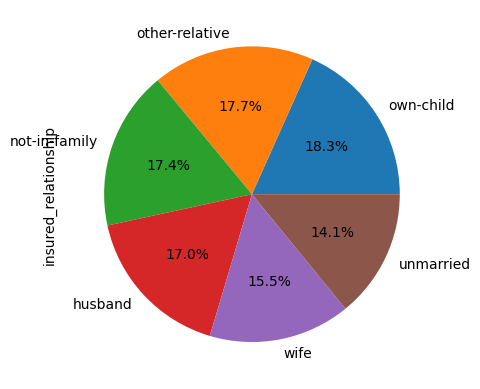

In [42]:
df['insured_relationship'].value_counts().plot.pie(autopct="%1.1f%%",labels = ['own-child', 'other-relative', 'not-in-family', 'husband', 'wife', 'unmarried'])

In [43]:
df['insured_relationship'].value_counts()*100/len(df)

own-child         18.3
other-relative    17.7
not-in-family     17.4
husband           17.0
wife              15.5
unmarried         14.1
Name: insured_relationship, dtype: float64

<AxesSubplot: xlabel='insured_hobbies'>

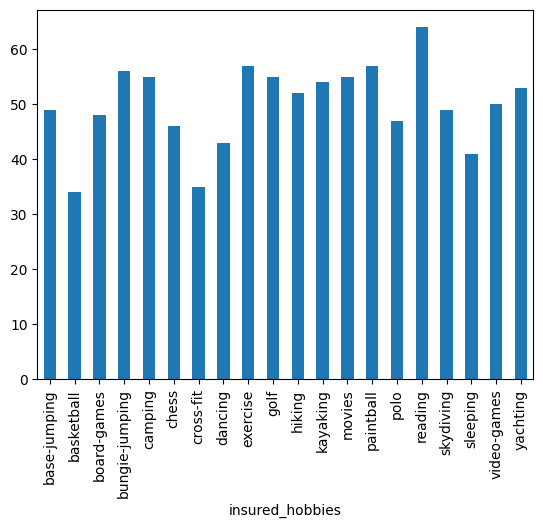

In [44]:
df.groupby('insured_hobbies').insured_hobbies.count().plot.bar()

In [45]:
df['auto_model'].unique()
df['auto_model'].value_counts()

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

In [46]:
df['auto_year'].unique()

array([2004, 2007, 2014, 2009, 2003, 2012, 2015, 1996, 2002, 2006, 2000,
       2010, 1999, 2011, 2005, 2008, 1995, 2001, 1998, 1997, 2013],
      dtype=int64)

<AxesSubplot: xlabel='capital-gains', ylabel='Density'>

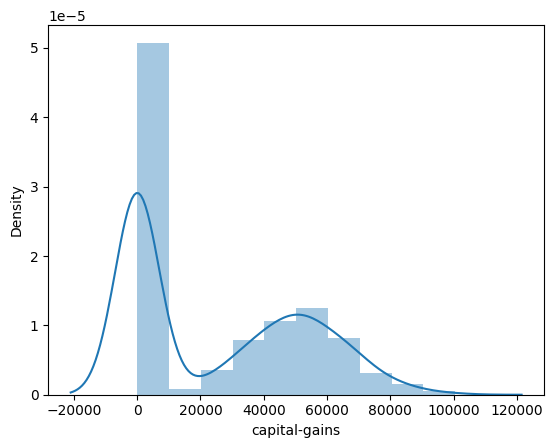

In [47]:
sns.distplot(df['capital-gains'])

<AxesSubplot: xlabel='policy_deductable', ylabel='Density'>

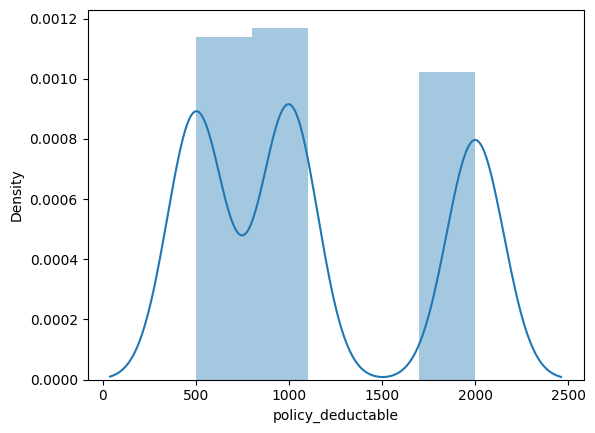

In [48]:
sns.distplot(df['policy_deductable'])

In [49]:
df['policy_deductable'].unique()

array([1000, 2000,  500], dtype=int64)

<AxesSubplot: xlabel='policy_annual_premium', ylabel='Density'>

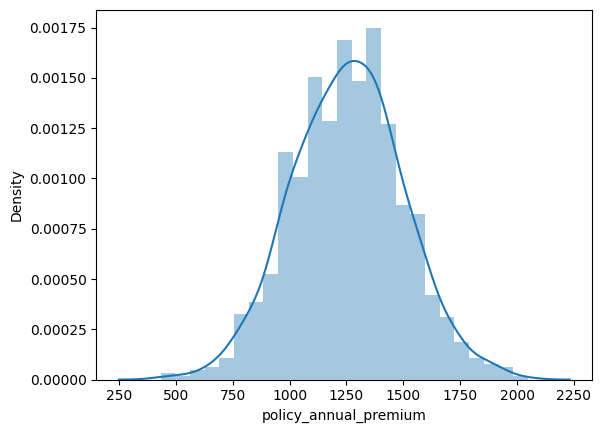

In [50]:
sns.distplot(df['policy_annual_premium'])

In [51]:
df['umbrella_limit'].value_counts()

 0           798
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64

In [52]:
df['insured_zip'].value_counts()#insured_zip

477695    2
469429    2
446895    2
431202    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: insured_zip, Length: 995, dtype: int64

<AxesSubplot: xlabel='capital-loss', ylabel='Density'>

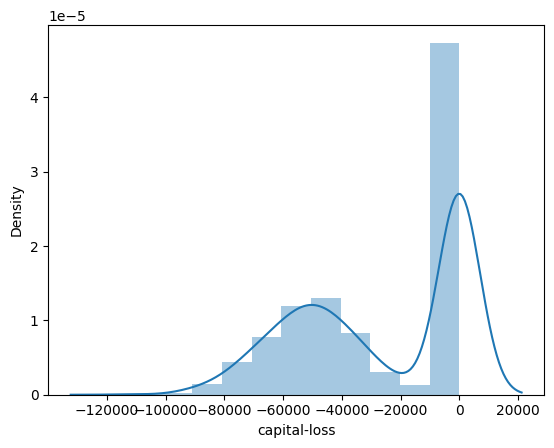

In [53]:
sns.distplot(df['capital-loss'])

In [54]:
corr=df.corr()

<AxesSubplot: >

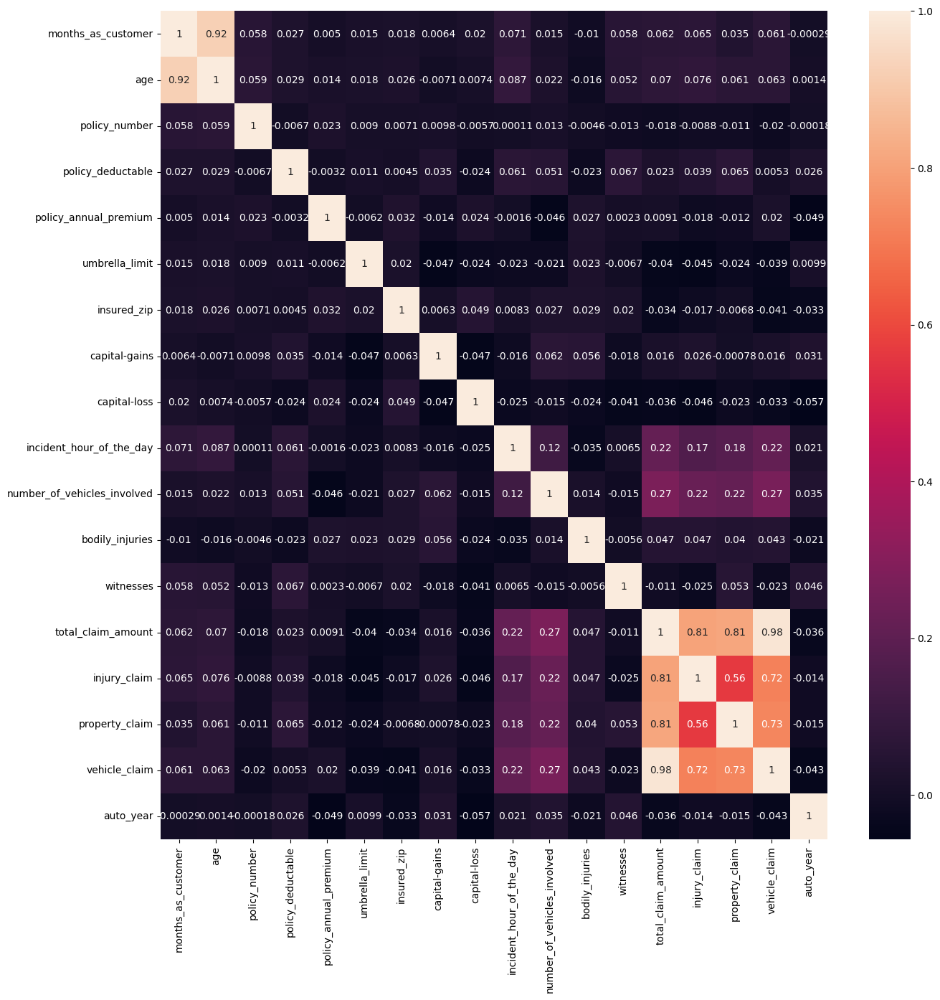

In [55]:
plt.figure(figsize=(15,15))
sns.heatmap(corr,annot=True)

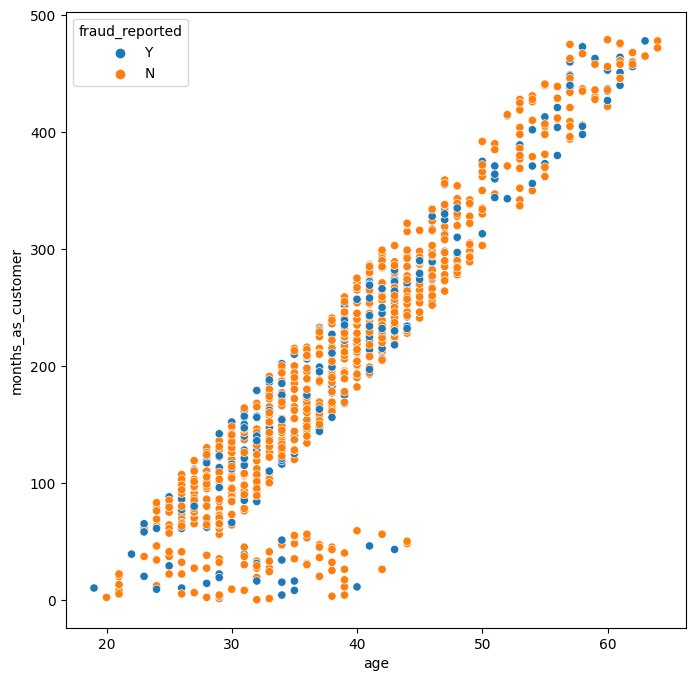

In [56]:
plt.figure(figsize=(8,8))
sns.scatterplot(x='age',y='months_as_customer',data=df,hue='fraud_reported')
plt.show()

In [133]:
sns.pairplot(data=df)

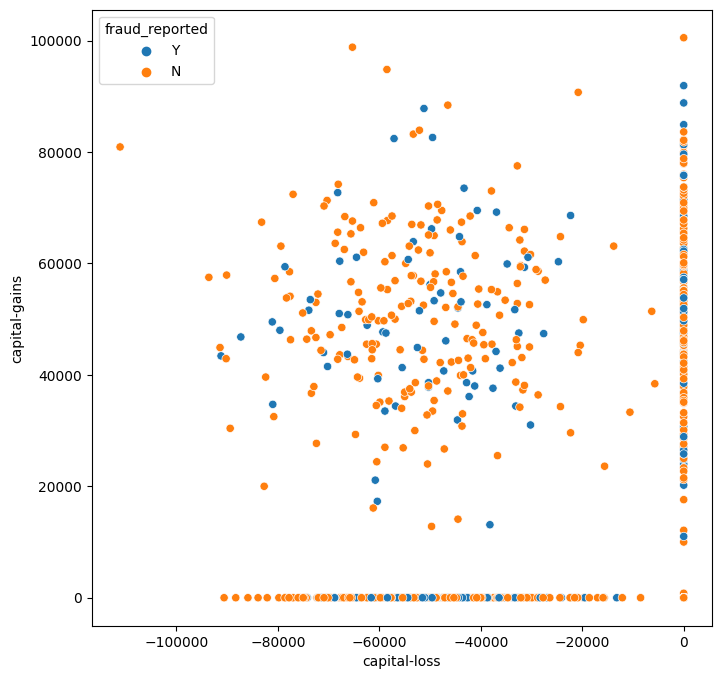

In [57]:
plt.figure(figsize=(8,8))
sns.scatterplot(x='capital-loss',y='capital-gains',data=df,hue='fraud_reported')
plt.show()

In [58]:
df.isnull().sum()*100/len(df)


months_as_customer              0.0
age                             0.0
policy_number                   0.0
policy_bind_date                0.0
policy_state                    0.0
policy_csl                      0.0
policy_deductable               0.0
policy_annual_premium           0.0
umbrella_limit                  0.0
insured_zip                     0.0
insured_sex                     0.0
insured_education_level         0.0
insured_occupation              0.0
insured_hobbies                 0.0
insured_relationship            0.0
capital-gains                   0.0
capital-loss                    0.0
incident_date                   0.0
incident_type                   0.0
collision_type                 17.8
incident_severity               0.0
authorities_contacted           0.0
incident_state                  0.0
incident_city                   0.0
incident_location               0.0
incident_hour_of_the_day        0.0
number_of_vehicles_involved     0.0
property_damage             

In [59]:
Missing_coulmn=[]
for i in df.columns:
    if df[i].isnull().sum() !=0:
        df[i].fillna(df[i].mode()[0],inplace=True)

In [60]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [61]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Target']=le.fit_transform(df['fraud_reported'])

In [62]:
df.drop(['fraud_reported'],axis=1,inplace=True)

In [63]:
df.head(2)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,Target
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,1
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,1


### irreleavant columns: policy_number is not required as it no help in prediction fraud case policy_bind_date is not required as we have months_as_customer, how old is policy insured_zip is not required as we have policy_state and many mored details for insured like sex,education,hobby,occupation,relationship

In [64]:
df['policy_csl'].unique()

array(['250/500', '100/300', '500/1000'], dtype=object)

In [65]:
df['Vehicle_Age']= 2022-df['auto_year']
df['Vehicle_Age']


0      18
1      15
2      15
3       8
4      13
       ..
995    16
996     7
997    26
998    24
999    15
Name: Vehicle_Age, Length: 1000, dtype: int64

In [66]:
df['incident_hour_of_the_day'].unique()

array([ 5,  8,  7, 20, 19,  0, 23, 21, 14, 22,  9, 12, 15,  6, 16,  4, 10,
        1, 17,  3, 11, 13, 18,  2], dtype=int64)

In [67]:
# dropping unimportant columns
df.drop(['policy_number', 
    'policy_csl',
    'insured_zip',
    'policy_bind_date', 
    'incident_date', 
    'incident_location', 
     'auto_year', 
    'incident_hour_of_the_day'],axis=1,inplace=True)

In [68]:
df

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,Target,Vehicle_Age
0,328,48,OH,1000,1406.91,0,MALE,MD,craft-repair,sleeping,...,2,YES,71610,6510,13020,52080,Saab,92x,1,18
1,228,42,IN,2000,1197.22,5000000,MALE,MD,machine-op-inspct,reading,...,0,NO,5070,780,780,3510,Mercedes,E400,1,15
2,134,29,OH,2000,1413.14,5000000,FEMALE,PhD,sales,board-games,...,3,NO,34650,7700,3850,23100,Dodge,RAM,0,15
3,256,41,IL,2000,1415.74,6000000,FEMALE,PhD,armed-forces,board-games,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,1,8
4,228,44,IL,1000,1583.91,6000000,MALE,Associate,sales,board-games,...,1,NO,6500,1300,650,4550,Accura,RSX,0,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,0,FEMALE,Masters,craft-repair,paintball,...,1,NO,87200,17440,8720,61040,Honda,Accord,0,16
996,285,41,IL,1000,1436.79,0,FEMALE,PhD,prof-specialty,sleeping,...,3,NO,108480,18080,18080,72320,Volkswagen,Passat,0,7
997,130,34,OH,500,1383.49,3000000,FEMALE,Masters,armed-forces,bungie-jumping,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,0,26
998,458,62,IL,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,base-jumping,...,1,YES,46980,5220,5220,36540,Audi,A5,0,24


In [69]:
cat_col=df.select_dtypes(include=['object'])
cat_col.columns

Index(['policy_state', 'insured_sex', 'insured_education_level',
       'insured_occupation', 'insured_hobbies', 'insured_relationship',
       'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'property_damage', 'police_report_available', 'auto_make',
       'auto_model'],
      dtype='object')

In [70]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()

In [71]:
for i in cat_col:
    le=LabelEncoder()
    df[i]=le.fit_transform(df[i])

In [72]:
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,Target,Vehicle_Age
0,328,48,2,1000,1406.91,0,1,4,2,17,...,2,1,71610,6510,13020,52080,10,1,1,18
1,228,42,1,2000,1197.22,5000000,1,4,6,15,...,0,0,5070,780,780,3510,8,12,1,15
2,134,29,2,2000,1413.14,5000000,0,6,11,2,...,3,0,34650,7700,3850,23100,4,30,0,15
3,256,41,0,2000,1415.74,6000000,0,6,1,2,...,2,0,63400,6340,6340,50720,3,34,1,8
4,228,44,0,1000,1583.91,6000000,1,0,11,2,...,1,0,6500,1300,650,4550,0,31,0,13


In [73]:
X=df.drop('Target',axis=1)
y=df['Target']

In [74]:
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV

In [75]:
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=123,test_size=0.2)

In [76]:
X_train.shape

(800, 31)

In [77]:
X_test.shape

(200, 31)

In [78]:
y_train.shape

(800,)

In [79]:
y_test.shape

(200,)

In [80]:
from sklearn.preprocessing import StandardScaler
se= StandardScaler()

In [81]:
X_train_scaled =se.fit_transform(X_train)
X_test_scaled =se.fit_transform(X_test)

In [82]:
from sklearn.linear_model import LogisticRegression

In [83]:
clf=LogisticRegression()

In [84]:
clf.fit(X_train,y_train)

LogisticRegression()

In [85]:
y_train_pred=clf.predict(X_train)
y_test_pred=clf.predict(X_test)

In [86]:
from sklearn import metrics

In [87]:
print("Train Data")
accuracy=metrics.accuracy_score(y_train,y_train_pred)
print(accuracy)
print("test Data")
accuracy_test=metrics.accuracy_score(y_test,y_test_pred)
print(accuracy_test)

Train Data
0.74875
test Data
0.785


In [88]:
train_proba=clf.predict_proba(X_train)
test_proba=clf.predict_proba(X_test)

In [94]:
train_proba[:,0]

array([0.7252139 , 0.64806753, 0.65637571, 0.58890111, 0.53362398,
       0.74593263, 0.63406948, 0.68285853, 0.81884447, 0.78588295,
       0.83413105, 0.65554397, 0.75651318, 0.66027205, 0.7345902 ,
       0.786393  , 0.67352247, 0.76753237, 0.61743752, 0.83735626,
       0.85613434, 0.77356104, 0.86931161, 0.76618757, 0.74853938,
       0.6561771 , 0.75674781, 0.71015046, 0.73614907, 0.61582245,
       0.78858836, 0.85403787, 0.87632735, 0.8056111 , 0.77513344,
       0.81760047, 0.66554862, 0.69063357, 0.68356463, 0.83869614,
       0.8290068 , 0.50302187, 0.74640074, 0.72942355, 0.72779631,
       0.72933296, 0.69196102, 0.72314349, 0.78456362, 0.75546378,
       0.75987818, 0.69333835, 0.65266383, 0.84065678, 0.76310609,
       0.8757517 , 0.67210347, 0.8033749 , 0.63624074, 0.78272885,
       0.69858306, 0.71329804, 0.63259541, 0.86174744, 0.73635767,
       0.84940663, 0.73717973, 0.61257642, 0.81892872, 0.65902992,
       0.71758689, 0.72687389, 0.87769701, 0.8361804 , 0.82570

In [108]:
train_proba=model.predict_proba(X_train)[:,1]
test_proba=model.predict_proba(X_test)[:,1]

In [96]:
print(metrics.classification_report(y_train,y_train_pred))
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.75      0.99      0.86       598
           1       0.57      0.02      0.04       202

    accuracy                           0.75       800
   macro avg       0.66      0.51      0.45       800
weighted avg       0.71      0.75      0.65       800

              precision    recall  f1-score   support

           0       0.78      1.00      0.88       155
           1       1.00      0.04      0.09        45

    accuracy                           0.79       200
   macro avg       0.89      0.52      0.48       200
weighted avg       0.83      0.79      0.70       200



In [98]:
from sklearn import metrics
def classification_metrics(y_actual,y_proba,threshold):
    y_pred_temp=[1 if p>threshold else 0 for p in y_proba]
    accuracy=metrics.accuracy_score(y_actual,y_pred_temp)
    precision=metrics.precision_score(y_actual,y_pred_temp)
    recall =metrics.recall_score(y_actual,y_pred_temp)
    f1_score=metrics.f1_score(y_actual,y_pred_temp)
    roc_auc=metrics.roc_auc_score(y_actual,y_proba)
    return {"Accuracy":accuracy,"Precision":precision,"Recall":recall,"F1-score":f1_score,"ROC_AUC":roc_auc}

In [99]:
class_weight=['None','balanced']
c=[0.1,0.001,1,10,100,0.01,1000]
param_grid=dict(C=c,class_weight=class_weight)

In [100]:
param_grid

{'C': [0.1, 0.001, 1, 10, 100, 0.01, 1000],
 'class_weight': ['None', 'balanced']}

In [101]:
from sklearn.model_selection import GridSearchCV

In [102]:
grid=GridSearchCV(clf,param_grid=param_grid,scoring='accuracy',n_jobs=-1,cv=3)
grid_result=grid.fit(X_train,y_train)

In [103]:
grid_result.best_params_

{'C': 0.1, 'class_weight': 'None'}

In [104]:
grid_result.best_score_

0.7487539072400101

In [105]:
model=LogisticRegression(C=0.1,class_weight='balanced')

In [106]:
model.fit(X_train,y_train)

LogisticRegression(C=0.1, class_weight='balanced')

In [107]:
y_pred_train=model.predict(X_train)
y_pred_test=model.predict(X_test)

In [109]:
print(metrics.classification_report(y_train,y_train_pred))
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.75      0.99      0.86       598
           1       0.57      0.02      0.04       202

    accuracy                           0.75       800
   macro avg       0.66      0.51      0.45       800
weighted avg       0.71      0.75      0.65       800

              precision    recall  f1-score   support

           0       0.78      1.00      0.88       155
           1       1.00      0.04      0.09        45

    accuracy                           0.79       200
   macro avg       0.89      0.52      0.48       200
weighted avg       0.83      0.79      0.70       200



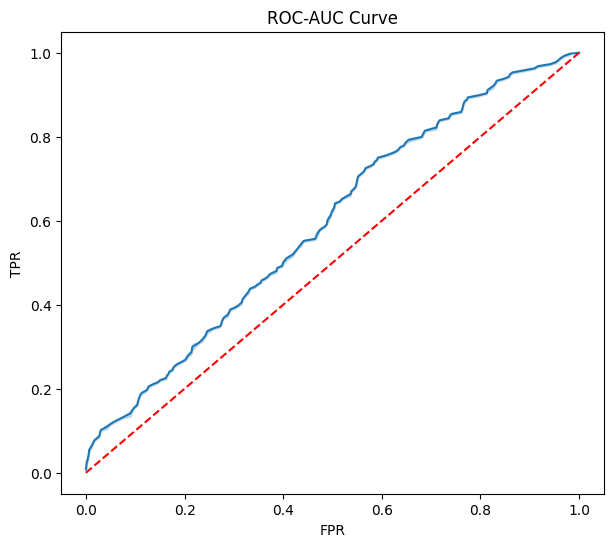

In [110]:
fpr,tpr,th=metrics.roc_curve(y_train,train_proba)
plt.figure(figsize=(7,6))
sns.lineplot(x=fpr,y=tpr)
sns.lineplot(x=[0.0,1],y=[0.0,1],color='red',linestyle="--")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC-AUC Curve")
plt.show()

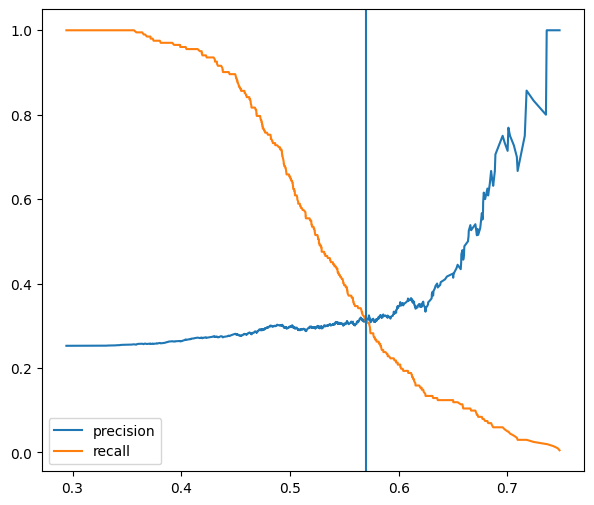

In [111]:
p,r,th=metrics.precision_recall_curve(y_train,train_proba)
plt.figure(figsize=(7,6))
sns.lineplot(x=th,y=p[:-1],label="precision")
sns.lineplot(x=th,y=r[:-1],label='recall')
plt.axvline(0.57)
plt.show()

In [112]:
print("Train Data")
classification_metrics(y_train,train_proba,0.57)
print("Test Data")
classification_metrics(y_test,test_proba,0.57)

Train Data
Test Data


{'Accuracy': 0.645,
 'Precision': 0.25925925925925924,
 'Recall': 0.3111111111111111,
 'F1-score': 0.2828282828282828,
 'ROC_AUC': 0.545663082437276}

### KNN-K NEAREST NEIGHBORS:

In [113]:
from sklearn.neighbors import KNeighborsClassifier

In [114]:
clf=KNeighborsClassifier(n_neighbors=4,p=1,metric= "minkowski")

In [115]:
clf.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=4, p=1)

In [116]:
y_pred_train=clf.predict(X_train)
y_pred_test=clf.predict(X_test)

In [117]:
print("Train Data")
print(metrics.classification_report(y_train,y_pred_train))
print("Test Data")
print(metrics.classification_report(y_test,y_pred_test))

Train Data
              precision    recall  f1-score   support

           0       0.78      0.98      0.87       598
           1       0.78      0.19      0.31       202

    accuracy                           0.78       800
   macro avg       0.78      0.59      0.59       800
weighted avg       0.78      0.78      0.73       800

Test Data
              precision    recall  f1-score   support

           0       0.77      0.92      0.84       155
           1       0.14      0.04      0.07        45

    accuracy                           0.73       200
   macro avg       0.46      0.48      0.45       200
weighted avg       0.63      0.72      0.67       200



In [118]:
f1_score=metrics.f1_score(y_train,y_pred_train,average='weighted')
accuaracy=metrics.accuracy_score(y_train,y_pred_train)

In [119]:
k=np.arange(1,5)

<AxesSubplot: >

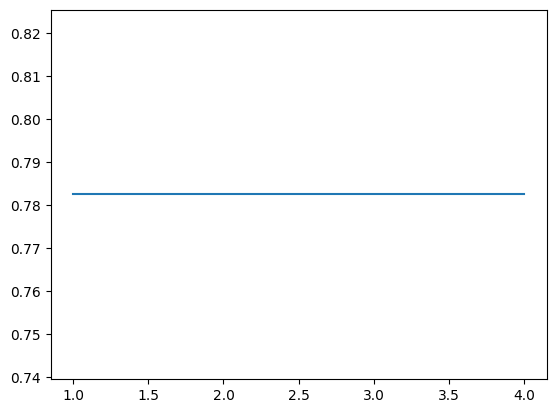

In [120]:
sns.lineplot(x=k,y=accuaracy)

### DecisionTree:

In [121]:
from sklearn.tree import DecisionTreeClassifier

In [122]:
dt=DecisionTreeClassifier()

In [123]:
def my_model(model):
    model.fit(X_train,y_train)
    y_pred_train=model.predict(X_train)
    y_pred_test=model.predict(X_test)
    print("Train Data")
    print(classification_report(y_train,y_pred_train))
    print("Test Data")
    print(classification_report(y_test,y_pred_test))
    return model

In [124]:
dt=DecisionTreeClassifier()

In [125]:
my_model(dt)

Train Data
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       598
           1       1.00      1.00      1.00       202

    accuracy                           1.00       800
   macro avg       1.00      1.00      1.00       800
weighted avg       1.00      1.00      1.00       800

Test Data
              precision    recall  f1-score   support

           0       0.86      0.90      0.88       155
           1       0.59      0.49      0.54        45

    accuracy                           0.81       200
   macro avg       0.73      0.70      0.71       200
weighted avg       0.80      0.81      0.80       200



DecisionTreeClassifier()

In [126]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\mainawati\AppData\Roaming\Microsoft\Windows\Start Menu\Programs\Python 3.10\Scripts\python.exe -m pip install --upgrade pip' command.


In [127]:
from xgboost import XGBClassifier

In [128]:
xgb = XGBClassifier()

In [130]:
model = XGBClassifier(scale_pos_weight=1)

In [132]:
print("Train Data")
print(metrics.classification_report(y_train,y_pred_train))
print("Test Data")
print(metrics.classification_report(y_test,y_pred_test))

Train Data
              precision    recall  f1-score   support

           0       0.78      0.98      0.87       598
           1       0.78      0.19      0.31       202

    accuracy                           0.78       800
   macro avg       0.78      0.59      0.59       800
weighted avg       0.78      0.78      0.73       800

Test Data
              precision    recall  f1-score   support

           0       0.77      0.92      0.84       155
           1       0.14      0.04      0.07        45

    accuracy                           0.73       200
   macro avg       0.46      0.48      0.45       200
weighted avg       0.63      0.72      0.67       200



### I have implemented Logistic Regression,KNN,Decision Tree,XG boost classifier in  machine learning algorithm.
### The  more accurate and better performance of XG boost classifier.